In [882]:
import os
import numpy as np
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score,classification_report
from sklearn.metrics import roc_curve, auc

# Time series decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

# Chart drawing
import plotly as py
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Mute sklearn warnings
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=DeprecationWarning)

# Show charts when running kernel
init_notebook_mode(connected=True)

# Change default background color for all visualizations
layout=go.Layout(paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(250,250,250,0.8)')
fig = go.Figure(layout=layout)
templated_fig = pio.to_templated(fig)
pio.templates['my_template'] = templated_fig.layout.template
pio.templates.default = 'my_template'

In [883]:
# Split data into training/validation and test sets based on dates
start_date = '1992-01-31'
end_date = '2024-07-20'

In [884]:
stock_name = 'XRM'

# Technical Analysis
file_path_1 = '/Users/edocampione/Desktop/Meng Engineering Science/4YP/data/ExxonMobil_CRSP_daily_data_alltime.csv' # Daily data (CRSP)

# Fundamental Analysis
file_path_2 = '/Users/edocampione/Desktop/Meng Engineering Science/4YP/data/ExxonMobil_Compustat_q_data_alltime.csv' # Fundamentals (Compustat)
file_path_3 = '/Users/edocampione/Desktop/Meng Engineering Science/4YP/data/ExxonMobil_Compustat_quarterly_ratiodata_alltime.csv' # Ratios (Compustat)

In [885]:
df2 = pd.read_csv(file_path_2)
df3 = pd.read_csv(file_path_3)
df2['datadate'] = pd.to_datetime(df2['datadate'])  # Fundamental data
df3['qdate'] = pd.to_datetime(df3['qdate'])  # Financial ratios data

# Make a copy of df2 to avoid modifying the original data
df2_pct = df2.copy()

# Identify numeric columns that should be converted to percentage changes
# Exclude non-numeric columns such as 'gvkey', 'datadate', 'fyearq', 'fqtr', 'indfmt', 'consol', 'popsrc', 'datafmt', 'tic', 'curcdq', 'datacqtr', 'datafqtr', 'costat'
columns_to_change = ['epsfxq', 'ltq', 'niq', 'revtq', 'capxy']
# Apply pct_change to each selected column and multiply by 100 to express as percentage
df2_pct[columns_to_change] = df2[columns_to_change].pct_change() * 100

# Sort by qdate and public_date to ensure the most recent public_date comes last
df3 = df3.sort_values(by=['qdate', 'public_date'])
# Drop duplicates to keep only the latest public_date for each qdate
df3 = df3.drop_duplicates(subset='qdate', keep='last')

# Make a copy to avoid modifying the original df3_latest
df3_pct = df3.copy()

# Select columns to calculate percentage change, excluding identifier and date columns
columns_to_change = ['npm', 'de_ratio', 'curr_ratio', 'ptb'] # Apply pct_change to each selected column and multiply by 100 to express as percentage
df3_pct[columns_to_change] = df3[columns_to_change].pct_change() * 100

df_fundamental = pd.merge_asof(
    df2,  # Daily data sorted by date
    df3,  # Fundamental data sorted by quarterly date
    left_on='datadate', right_on='qdate',  # Merge on dates
    direction='backward'  # Merge to the closest past quarter
)

fundamentals = [ 'epsfxq', 'ltq', 'niq', 'revtq', 'capxy', 'npm']
ratios = ['datadate', 'de_ratio', 'curr_ratio', 'ptb']
column_renames = {
    'epsfxq': 'earnings_per_share', 
    'ltq': 'long_term_debt', 
    'niq': 'net_income', 
    'revtq': 'revenue', 
    'capxy': 'capital_expenditure', 
    'npm': 'net_profit_margin', 
    'de_ratio': 'debt_equity_ratio', 
    'curr_ratio': 'current_ratio', 
    'ptb': 'price_to_book_ratio'
}
df_fundamental = df_fundamental[fundamentals + ratios].rename(columns=column_renames)
df_fundamental.loc[:, df_fundamental.columns != 'datadate'] = df_fundamental.loc[:, df_fundamental.columns != 'datadate'].pct_change()

#df_fundamental = df_fundamental.dropna()
#df_fundamental = df_fundamental[(df_fundamental['datadate'] >= start_date) & (df_fundamental['datadate'] <= end_date)].copy()
#df_fundamental.index = range(len(df_fundamental))

df_fundamental.head()


,earnings_per_share,long_term_debt,net_income,revenue,capital_expenditure,net_profit_margin,datadate,debt_equity_ratio,current_ratio,price_to_book_ratio
0,NaN,NaN,NaN,NaN,NaN,NaN,1962-03-31,NaN,NaN,NaN
1,NaN,NaN,-0.160173,-0.000775,NaN,NaN,1962-06-30,NaN,NaN,NaN
2,NaN,NaN,0.113402,0.048487,NaN,NaN,1962-09-30,NaN,NaN,NaN
3,NaN,NaN,-0.074074,0.004440,NaN,NaN,1962-12-31,NaN,NaN,NaN
4,NaN,NaN,0.295000,0.011418,NaN,NaN,1963-03-31,NaN,NaN,NaN


In [886]:
df = pd.read_csv(file_path_1)

df['date'] = pd.to_datetime(df['date'])  # CRSP daily data
df = df[(df['date'] >= start_date) & (df['date'] <= end_date)].copy()
df.index = range(len(df))

df.head()

,PERMNO,date,TICKER,BIDLO,ASKHI,PRC,VOL,RET,OPENPRC
0,11850,1992-01-31,XON,58.250,59.250,58.250,1151100.0,-0.012712,NaN
1,11850,1992-02-03,XON,58.250,59.250,59.125,1032300.0,0.015021,NaN
2,11850,1992-02-04,XON,58.875,59.625,59.500,1563500.0,0.006342,NaN
3,11850,1992-02-05,XON,57.750,58.500,58.000,1226000.0,-0.013950,NaN
4,11850,1992-02-06,XON,57.750,58.625,58.625,1178100.0,0.010776,NaN


In [887]:
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Ohlc(x=df.date,
                      open=df.OPENPRC,
                      high=df.ASKHI,
                      low=df.BIDLO,
                      close=df.PRC,
                      name='Price'), row=1, col=1)

fig.add_trace(go.Scatter(x=df.date, y=df.VOL, name='Volume'), row=2, col=1)

fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

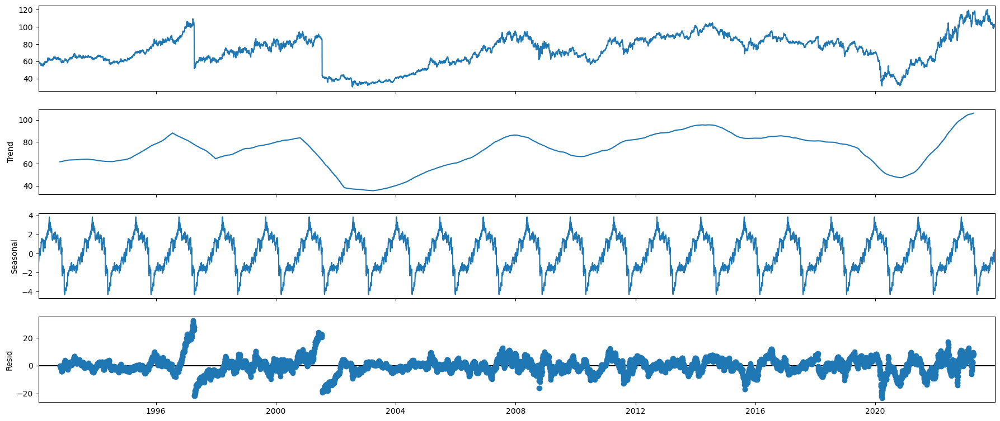

In [888]:
df_close = df[['date', 'PRC']].copy()
df_close = df_close.set_index('date')
df_close.head()

decomp = seasonal_decompose(df_close, period=365)
fig = decomp.plot()
fig.set_size_inches(20, 8)

In [889]:
df['EMA_30'] = df['PRC'].ewm(30).mean().shift()
df['SMA_5'] = df['PRC'].rolling(5).mean().shift()
df['SMA_15'] = df['PRC'].rolling(15).mean().shift()
df['SMA_30'] = df['PRC'].rolling(30).mean().shift()
df['SMA_60'] = df['PRC'].rolling(60).mean().shift()
df['SMA_90'] = df['PRC'].rolling(90).mean().shift()
df['SMA_120'] = df['PRC'].rolling(120).mean().shift()

fig = go.Figure()
fig.add_trace(go.Scatter(x=df.date, y=df.EMA_30, name='EMA 30'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_5, name='SMA 5'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_15, name='SMA 15'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_30, name='SMA 30'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_60, name='SMA 60'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_90, name='SMA 90'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_120, name='SMA 20'))
fig.add_trace(go.Scatter(x=df.date, y=df.PRC, name='PRC', opacity=0.2))
fig.show()

In [890]:
def relative_strength_idx(df, n=14):
    close = df['PRC']
    delta = close.diff()
    delta = delta[1:]
    pricesUp = delta.copy()
    pricesDown = delta.copy()
    pricesUp[pricesUp < 0] = 0
    pricesDown[pricesDown > 0] = 0
    rollUp = pricesUp.rolling(n).mean()
    rollDown = pricesDown.abs().rolling(n).mean()
    rs = rollUp / rollDown
    rsi = 100.0 - (100.0 / (1.0 + rs))
    return rsi

df['RSI'] = relative_strength_idx(df).fillna(0)

fig = go.Figure(go.Scatter(x=df.date, y=df.RSI, name='RSI'))
fig.show()

In [891]:
EMA_12 = pd.Series(df['PRC'].ewm(span=12, min_periods=12).mean())
EMA_26 = pd.Series(df['PRC'].ewm(span=26, min_periods=26).mean())
df['MACD'] = pd.Series(EMA_12 - EMA_26)
df['MACD_signal'] = pd.Series(df.MACD.ewm(span=9, min_periods=9).mean())

fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=df.date, y=df.PRC, name='PRC'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.date, y=EMA_12, name='EMA 12'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.date, y=EMA_26, name='EMA 26'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.date, y=df['MACD'], name='MACD'), row=2, col=1)
fig.add_trace(go.Scatter(x=df.date, y=df['MACD_signal'], name='Signal line'), row=2, col=1)
fig.show()

In [892]:
def calculate_adx(df, period=14):
    """
    Adds the ADX (Average Directional Index) column to a given DataFrame.

    Parameters:
        df (pd.DataFrame): DataFrame containing 'ASKHI', 'BIDLO', and 'PRC' columns.
        period (int): The lookback period for ADX calculation (default is 14).

    Returns:
        pd.DataFrame: DataFrame with an additional 'ADX' column (values between 0-100).
    """
    # Compute True Range (TR)
    df['High-Low'] = df['ASKHI'] - df['BIDLO']
    df['High-Close'] = abs(df['ASKHI'] - df['PRC'].shift(1))
    df['Low-Close'] = abs(df['BIDLO'] - df['PRC'].shift(1))
    df['TR'] = df[['High-Low', 'High-Close', 'Low-Close']].max(axis=1)

    # Compute Directional Movement (+DM and -DM)
    df['+DM'] = np.where((df['ASKHI'].diff() > df['BIDLO'].diff()) & (df['ASKHI'].diff() > 0), df['ASKHI'].diff(), 0)
    df['-DM'] = np.where((df['BIDLO'].diff() > df['ASKHI'].diff()) & (df['BIDLO'].diff() > 0), df['BIDLO'].diff(), 0)

    # Compute smoothed values using Wilder's smoothing (EMA-like smoothing)
    df['Smooth TR'] = df['TR'].rolling(window=period).mean()
    df['Smooth +DM'] = df['+DM'].rolling(window=period).mean()
    df['Smooth -DM'] = df['-DM'].rolling(window=period).mean()

    # Compute +DI and -DI as percentages (THIS FIXES SCALING ISSUES)
    df['+DI'] = (df['Smooth +DM'] / df['Smooth TR']) * 100
    df['-DI'] = (df['Smooth -DM'] / df['Smooth TR']) * 100

    # Compute DX (Directional Index)
    df['DX'] = (abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])) * 100

    # Compute ADX (Average of DX over the period) using Rolling Mean
    df['ADX'] = df['DX'].rolling(window=period).mean()

    # Ensure ADX is properly constrained to 0-100
    df['ADX'] = df['ADX'].clip(lower=0, upper=100)

    # Drop unnecessary intermediate columns
    df.drop(columns=['High-Low', 'High-Close', 'Low-Close', '+DM', '-DM', 'Smooth TR', 'Smooth +DM', 'Smooth -DM', 'DX'], inplace=True)

    return df

# Example Usage:
# df = pd.read_csv('your_stock_data.csv')  # Ensure your data has 'ASKHI', 'BIDLO', 'PRC' columns
# df = calculate_adx(df)


df = calculate_adx(df)
df = df.dropna()


In [ ]:
df.index = range(len(df))  # Reset index
print(df.isna().sum().sum())

df.head(10)

0


,PERMNO,date,TICKER,BIDLO,ASKHI,PRC,VOL,RET,OPENPRC,EMA_30,...,SMA_60,SMA_90,SMA_120,RSI,MACD,MACD_signal,TR,+DI,-DI,ADX
0,11850,1992-07-23,XON,61.750,63.125,63.000,773300.0,0.016129,62.000,61.059478,...,61.229167,59.736111,59.123958,59.574468,0.188399,0.128419,1.375,20.618557,9.278351,44.169795
1,11850,1992-07-24,XON,62.125,62.875,62.375,521100.0,-0.009921,62.750,61.123282,...,61.291667,59.804167,59.163542,52.000000,0.199665,0.142668,0.875,18.947368,12.631579,42.026937
2,11850,1992-07-27,XON,62.000,62.250,62.000,453000.0,-0.006012,62.125,61.164413,...,61.345833,59.865278,59.190625,52.000000,0.176303,0.149395,0.375,20.000000,13.333333,38.353468
3,11850,1992-07-28,XON,61.875,62.500,62.125,1044000.0,0.002016,62.125,61.191854,...,61.379167,59.934722,59.211458,52.941176,0.165961,0.152708,0.625,22.471910,13.483146,35.194127
4,11850,1992-07-29,XON,61.750,62.125,62.000,1202000.0,-0.002012,62.125,61.222481,...,61.427083,60.009722,59.245833,52.941176,0.145996,0.151366,0.375,22.471910,11.235955,34.241746
5,11850,1992-07-30,XON,62.125,63.625,63.375,1377500.0,0.022177,62.125,61.247985,...,61.460417,60.090278,59.273958,62.295082,0.238371,0.168767,1.625,29.896907,10.309278,34.150171
6,11850,1992-07-31,XON,63.000,63.750,63.500,809400.0,0.001972,63.250,61.317718,...,61.518750,60.180556,59.314583,66.101695,0.317999,0.198613,0.750,29.896907,17.525773,32.442097
7,11850,1992-08-03,XON,63.250,64.625,64.250,942100.0,0.011811,63.375,61.389226,...,61.587500,60.273611,59.357292,65.517241,0.436587,0.246208,1.375,32.653061,17.346939,30.342971
8,11850,1992-08-04,XON,64.375,65.125,65.000,1163400.0,0.011673,64.500,61.482918,...,61.681250,60.376389,59.408333,74.576271,0.584350,0.313836,0.875,32.989691,25.773196,27.478668
9,11850,1992-08-05,XON,63.875,64.875,64.000,1150500.0,-0.015385,64.625,61.598048,...,61.783333,60.479167,59.460417,60.344828,0.613690,0.373807,1.125,30.208333,26.041667,23.841102


In [ ]:
horizon = 30

# Define the target variable directly
df['target'] = (df['PRC'].shift(-horizon) > df['PRC']).astype(int)

# Drop NaNs resulting from the shift
df = df.dropna()
df.index = range(len(df))  # Reset index

df.tail()

#print(len(df))


,PERMNO,date,TICKER,BIDLO,ASKHI,PRC,VOL,RET,OPENPRC,EMA_30,...,SMA_90,SMA_120,RSI,MACD,MACD_signal,TR,+DI,-DI,ADX,target
7912,11850,2023-12-22,XOM,101.820,102.94,101.91,12927831.0,0.001769,102.31,104.793288,...,108.282000,107.652500,48.316062,-0.811478,-1.264758,1.210,24.187795,9.428453,54.938717,0
7913,11850,2023-12-26,XOM,102.115,103.03,102.14,16835144.0,0.002257,102.74,104.700279,...,108.232778,107.610833,56.213450,-0.688431,-1.149492,1.120,25.141591,10.940708,55.407454,0
7914,11850,2023-12-27,XOM,101.335,102.55,101.66,14558830.0,-0.004699,102.04,104.617689,...,108.163222,107.604333,59.937646,-0.622471,-1.044088,1.215,26.327338,11.456701,55.428012,0
7915,11850,2023-12-28,XOM,100.130,101.61,100.19,16329252.0,-0.014460,101.39,104.522280,...,108.070111,107.591833,56.502572,-0.680965,-0.971464,1.530,27.199649,12.049373,55.553082,0
7916,11850,2023-12-29,XOM,99.620,100.59,99.98,17746408.0,-0.002096,100.37,104.382529,...,107.975444,107.554333,51.694247,-0.735785,-0.924328,0.970,27.666955,9.398008,52.218836,0


In [ ]:
# Add fundamental data

df = pd.merge_asof(
    df,  # Daily data sorted by date
    df_fundamental,  # Fundamental data sorted by quarterly date
    left_on='date', right_on='datadate',  # Merge on dates
    direction='backward'  # Merge to the closest past quarter
)

df = df.drop('datadate', 1)
df.head()



,PERMNO,date,TICKER,BIDLO,ASKHI,PRC,VOL,RET,OPENPRC,EMA_30,...,target,earnings_per_share,long_term_debt,net_income,revenue,capital_expenditure,net_profit_margin,debt_equity_ratio,current_ratio,price_to_book_ratio
0,11850,1992-07-23,XON,61.750,63.125,63.000,773300.0,0.016129,62.000,61.059478,...,0,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
1,11850,1992-07-24,XON,62.125,62.875,62.375,521100.0,-0.009921,62.750,61.123282,...,1,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
2,11850,1992-07-27,XON,62.000,62.250,62.000,453000.0,-0.006012,62.125,61.164413,...,1,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
3,11850,1992-07-28,XON,61.875,62.500,62.125,1044000.0,0.002016,62.125,61.191854,...,1,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
4,11850,1992-07-29,XON,61.750,62.125,62.000,1202000.0,-0.002012,62.125,61.222481,...,1,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156


In [ ]:
test_size  = 0.15
valid_size = 0.15

test_split_idx  = int(df.shape[0] * (1-test_size))
valid_split_idx = int(df.shape[0] * (1-(valid_size+test_size)))

train_df  = df.loc[:valid_split_idx].copy()
valid_df  = df.loc[valid_split_idx+1:test_split_idx].copy()
test_df   = df.loc[test_split_idx+1:].copy()

#Ony keep the last day of each month
#test_df = test_df.loc[df.groupby(test_df['date'].dt.to_period('M'))['date'].idxmax()]
#test_df['target'] = (test_df['PRC'].shift(-1) > test_df['PRC']).astype(int)

df.head(10)

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_df.date, y=train_df.PRC, name='Training'))
fig.add_trace(go.Scatter(x=valid_df.date, y=valid_df.PRC, name='Validation'))
fig.add_trace(go.Scatter(x=test_df.date,  y=test_df.PRC,  name='Test'))
fig.show()

# save test dates
test_dates = test_df['date']

In [ ]:
drop_cols = ['date', 'VOL', 'BIDLO', 'ASKHI', 'RET', 'OPENPRC', 'TICKER', 'PERMNO']

train_df = train_df.drop(drop_cols, 1)
valid_df = valid_df.drop(drop_cols, 1)
test_df  = test_df.drop(drop_cols, 1)

train_df.head()

,PRC,EMA_30,SMA_5,SMA_15,SMA_30,SMA_60,SMA_90,SMA_120,RSI,MACD,...,target,earnings_per_share,long_term_debt,net_income,revenue,capital_expenditure,net_profit_margin,debt_equity_ratio,current_ratio,price_to_book_ratio
0,63.000,61.059478,62.100,61.825000,61.912500,61.229167,59.736111,59.123958,59.574468,0.188399,...,0,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
1,62.375,61.123282,62.200,61.908333,61.916667,61.291667,59.804167,59.163542,52.000000,0.199665,...,1,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
2,62.000,61.164413,62.250,61.941667,61.887500,61.345833,59.865278,59.190625,52.000000,0.176303,...,1,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
3,62.125,61.191854,62.225,61.933333,61.891667,61.379167,59.934722,59.211458,52.941176,0.165961,...,1,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
4,62.000,61.222481,62.300,61.958333,61.891667,61.427083,60.009722,59.245833,52.941176,0.145996,...,1,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156


In [ ]:
y_train = train_df['target'].copy()
X_train = train_df.drop(['target',], 1)

y_valid = valid_df['target'].copy()
X_valid = valid_df.drop(['target',], 1)

y_test  = test_df['target'].copy()
X_test  = test_df.drop(['target',], 1)

X_train.head()

,PRC,EMA_30,SMA_5,SMA_15,SMA_30,SMA_60,SMA_90,SMA_120,RSI,MACD,...,ADX,earnings_per_share,long_term_debt,net_income,revenue,capital_expenditure,net_profit_margin,debt_equity_ratio,current_ratio,price_to_book_ratio
0,63.000,61.059478,62.100,61.825000,61.912500,61.229167,59.736111,59.123958,59.574468,0.188399,...,44.169795,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
1,62.375,61.123282,62.200,61.908333,61.916667,61.291667,59.804167,59.163542,52.000000,0.199665,...,42.026937,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
2,62.000,61.164413,62.250,61.941667,61.887500,61.345833,59.865278,59.190625,52.000000,0.176303,...,38.353468,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
3,62.125,61.191854,62.225,61.933333,61.891667,61.379167,59.934722,59.211458,52.941176,0.165961,...,35.194127,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156
4,62.000,61.222481,62.300,61.958333,61.891667,61.427083,60.009722,59.245833,52.941176,0.145996,...,34.241746,0.73,51942.0,930.0,24547.0,3299.0,0.045,1.464,0.823,2.156


In [ ]:
# Scaling
scaler = MinMaxScaler()

# Fit the scaler on the training/validation data
X_train_scaled = scaler.fit_transform(X_train)

# Now apply the same scaling to the val/test data using the already fitted scaler
X_valid_scaled = scaler.transform(X_valid)
X_test_scaled = scaler.transform(X_test)

# Convert the scaled data back to DataFrame for consistency
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_valid_scaled = pd.DataFrame(X_valid_scaled, columns=X_valid.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

X_train_scaled.head(90)

,PRC,EMA_30,SMA_5,SMA_15,SMA_30,SMA_60,SMA_90,SMA_120,RSI,MACD,...,ADX,earnings_per_share,long_term_debt,net_income,revenue,capital_expenditure,net_profit_margin,debt_equity_ratio,current_ratio,price_to_book_ratio
0,0.413754,0.395730,0.396010,0.402575,0.409089,0.394106,0.377814,0.385051,0.610103,0.827513,...,0.474447,0.138264,0.037173,0.002995,0.016418,0.060686,0.012987,0.996795,0.030573,0.087019
1,0.405853,0.396671,0.397338,0.403733,0.409149,0.395014,0.378831,0.385666,0.528860,0.828184,...,0.447996,0.138264,0.037173,0.002995,0.016418,0.060686,0.012987,0.996795,0.030573,0.087019
2,0.401112,0.397277,0.398002,0.404197,0.408730,0.395802,0.379745,0.386086,0.528860,0.826791,...,0.402652,0.138264,0.037173,0.002995,0.016418,0.060686,0.012987,0.996795,0.030573,0.087019
3,0.402693,0.397682,0.397670,0.404081,0.408790,0.396287,0.380783,0.386409,0.538955,0.826175,...,0.363655,0.138264,0.037173,0.002995,0.016418,0.060686,0.012987,0.996795,0.030573,0.087019
4,0.401112,0.398133,0.398667,0.404428,0.408790,0.396984,0.381904,0.386943,0.538955,0.824984,...,0.351899,0.138264,0.037173,0.002995,0.016418,0.060686,0.012987,0.996795,0.030573,0.087019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,0.385311,0.400907,0.359817,0.367828,0.393340,0.406315,0.419525,0.436007,0.545715,0.778459,...,0.593584,0.196141,0.039119,0.017304,0.042997,0.114488,0.000000,0.990385,0.033121,0.085168
86,0.372669,0.400592,0.363802,0.367364,0.392921,0.405618,0.419235,0.435732,0.525901,0.781376,...,0.605340,0.196141,0.039119,0.017304,0.042997,0.114488,0.000000,0.990385,0.033121,0.085168
87,0.371089,0.399812,0.366126,0.366901,0.392083,0.404558,0.418840,0.435312,0.488255,0.783464,...,0.617095,0.196141,0.039119,0.017304,0.042997,0.114488,0.000000,0.990385,0.033121,0.085168
88,0.374249,0.398997,0.368450,0.367017,0.391065,0.403437,0.418425,0.434908,0.558002,0.786663,...,0.646485,0.196141,0.039119,0.017304,0.042997,0.114488,0.000000,0.990385,0.033121,0.085168


In [ ]:


%%time

parameters = {
    'n_estimators': [300],
    'learning_rate': [0.05],
    'max_depth': [8],
    'gamma': [0.00001],
    'random_state': [42]
}

eval_set = [(X_train_scaled, y_train), (X_valid_scaled, y_valid)]
model = xgb.XGBClassifier(eval_set=eval_set, objective='binary:logistic', verbose=False)
clf = GridSearchCV(model, parameters)

clf.fit(X_train_scaled, y_train)

print(f'Best params: {clf.best_params_}')
print(f'Best validation score = {clf.best_score_}')



/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[20:15:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "eval_set", "verbose" } are not used.


/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[20:15:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "eval_set", "verbose" } are not used.


/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[20:15:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "eval_set", "verbose" } are not used.


/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[20:15:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "eval_set", "verbose" } are not used.


/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[20:15:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { 

Best params: {'gamma': 1e-05, 'learning_rate': 0.05, 'max_depth': 8, 'n_estimators': 300, 'random_state': 42}
Best validation score = 0.5129711614522466
CPU times: user 41.8 s, sys: 1.32 s, total: 43.1 s
Wall time: 6.48 s


In [ ]:
%%time

model = xgb.XGBClassifier(**clf.best_params_, objective='binary:logistic')
model.fit(X_train_scaled, y_train, eval_set=eval_set, verbose=False)

CPU times: user 10.1 s, sys: 615 ms, total: 10.8 s
Wall time: 2.34 s


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1e-05, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

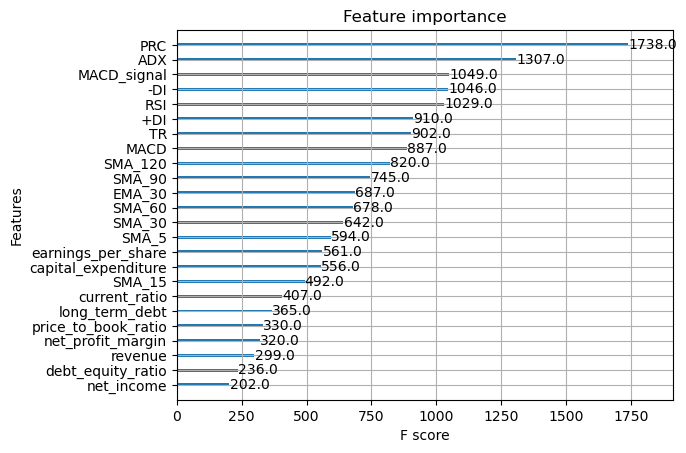

In [ ]:
plot_importance(model);

In [ ]:
y_pred = model.predict(X_test_scaled)
y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]  # Selecting only the positive class probability

test_df['y_pred'] = y_pred
test_df['y_pred_proba'] = y_pred_proba
test_df['date'] = test_dates

# Classification report
classification_report_data = classification_report(y_test, y_pred)
# Print the classification report
print(classification_report_data)


# Compute ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
print(roc_auc)

# Create interactive Plotly figure
fig = go.Figure()

# Add ROC curve
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'ROC curve (AUC = {roc_auc:.2f})',
                         line=dict(color='blue', width=2)))

# Add diagonal reference line
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', name='Random Guess',
                         line=dict(color='gray', dash='dash')))

# Add "Ideal Classifier" line
fig.add_trace(go.Scatter(
    x=[0, 0, 1], y=[0, 1, 1], mode='lines', 
    name='Ideal Classifier',
    line=dict(color='green', dash='dash')
))

# Layout settings
fig.update_layout(title="Receiver Operating Characteristic (ROC) Curve",
                  xaxis_title="False Positive Rate",
                  yaxis_title="True Positive Rate",
                  xaxis=dict(range=[0,1]),
                  yaxis=dict(range=[0,1.05]),
                  template="plotly_white")

# Show interactive plot
fig.show()


#test_df.head()

              precision    recall  f1-score   support

           0       0.49      0.55      0.52       557
           1       0.55      0.50      0.52       630

    accuracy                           0.52      1187
   macro avg       0.52      0.52      0.52      1187
weighted avg       0.52      0.52      0.52      1187

0.5715853067738167


In [ ]:
test_df_monthly = test_df.loc[df.groupby(test_df['date'].dt.to_period('M'))['date'].idxmax()]
buys = test_df_monthly[test_df_monthly['y_pred'] == 1]
sells = test_df_monthly[test_df_monthly['y_pred'] == 0]

fig = go.Figure()
fig.add_trace(go.Scatter(x=test_df.date,  y=test_df.PRC,  name='Test'))

# Add Green Up Arrows for most certain class 1 predictions
fig.add_trace(go.Scatter(
    x=buys.date, 
    y=buys.PRC,
    mode='markers',
    marker=dict(color='green', size=15, symbol='triangle-up'),
))

# Add Red Down Arrows for most certain class 0 predictions
fig.add_trace(go.Scatter(
    x=sells.date, 
    y=sells.PRC,
    mode='markers',
    marker=dict(color='red', size=15, symbol='triangle-down'),
))

fig.update_layout(
    height=600  # Adjust height (default is ~450-500)
)

fig.show()
